In [130]:
import sqlite3 as sql
import pandas as pd
import spacy
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
import re
import tqdm
import tqdm as notebook_tqdm
from textblob import TextBlob
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.cluster import DBSCAN

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\jaysh\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# FETCH DATA

In [3]:
# Connection with the database
def connect_to_db(db_path):
    try:
        conn = sql.connect(db_path)
        return conn
    except Exception as e:
        print(f"Error connecting to database: {e}")
        return None

# Fetch the data from the database
def fetch_text_data(conn):
    if conn is None:
        return pd.DataFrame()  # Return an empty DataFrame if connection failed
    query = 'SELECT * from content,links WHERE content.id = links.id'
    df = pd.read_sql_query(query, conn)
    return df

# Use the absolute path to the database file
db_path = 'C:/Users/jaysh/Documents/TFG/Code/data/processed/articles.db'
conn = connect_to_db(db_path)
df = fetch_text_data(conn)

if not df.empty:
    print('Data fetched from the database.')
        # Drop the duplicate 'id' column (assuming the second one is redundant)
    df = df.loc[:, ~df.columns.duplicated()]

    # Convert 'publish_date' to datetime format
    df["publish_date"] = pd.to_datetime(df["publish_date"])

    # Check the cleaned DataFrame
    print(df.info())

else:
    print("No data fetched from the database.")

Data fetched from the database.
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3832 entries, 0 to 3831
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   id              3832 non-null   int64         
 1   title           3832 non-null   object        
 2   publish_date    3832 non-null   datetime64[ns]
 3   text            3832 non-null   object        
 4   outlier         3832 non-null   int64         
 5   truncated_text  3832 non-null   object        
 6   tokens          3832 non-null   object        
 7   clean_text      3832 non-null   object        
 8   clean_title     3832 non-null   object        
 9   newspaper       3832 non-null   object        
 10  url             3832 non-null   object        
dtypes: datetime64[ns](1), int64(2), object(8)
memory usage: 329.4+ KB
None


# Vectorising Texts - KMEANS + DBSCAN

In [30]:
#Vectorising the texts using Word2Vec   
nlp = spacy.load('es_core_news_sm')

def vectorise_text(text):
    doc = nlp(text)
    return doc.vector

df['text_vector'] = df['clean_text'].apply(vectorise_text)



In [184]:
sample_vector = df['text_vector'].iloc[0]
print("Vector Shape:", sample_vector.shape)


Vector Shape: (96,)


In [187]:
from sklearn.metrics.pairwise import cosine_similarity

# Compute similarity between two randomly selected vectors
vec1 = df['text_vector'].iloc[0].reshape(1, -1)
vec2 = df['text_vector'].iloc[1].reshape(1, -1)

similarity = cosine_similarity(vec1, vec2)[0][0]
print(f"Cosine Similarity between Text 1 and Text 2: {similarity:.4f}")


Cosine Similarity between Text 1 and Text 2: 0.9559


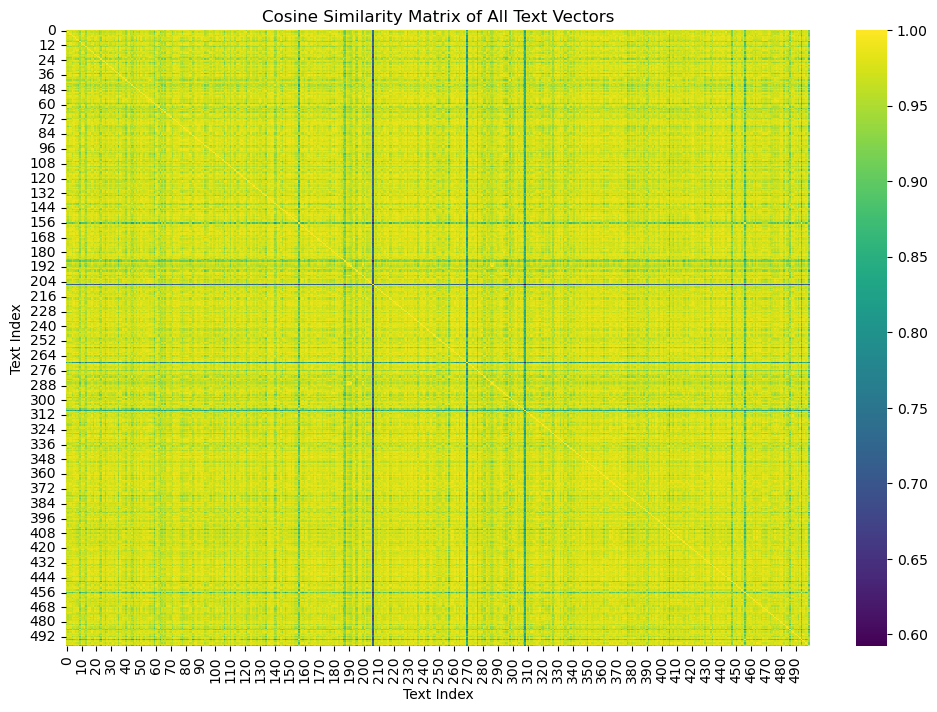


Average Cosine Similarity: 0.9656


In [200]:
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Extract all text vectors and convert to a matrix
text_vectors = np.vstack(df['text_vector'].values)

subset_vectors = text_vectors[:500]
similarity_matrix = cosine_similarity(subset_vectors)

# Plot heatmap of similarity matrix
plt.figure(figsize=(12, 8))
sns.heatmap(similarity_matrix, cmap='viridis')
plt.title("Cosine Similarity Matrix of All Text Vectors")
plt.xlabel("Text Index")
plt.ylabel("Text Index")
plt.show()
# Calculate the average cosine similarity (ignoring self-similarity which is always 1.0)
average_similarity = (np.sum(similarity_matrix) - np.trace(similarity_matrix)) / (similarity_matrix.size - len(similarity_matrix))

# Display the average cosine similarity
print(f"\nAverage Cosine Similarity: {average_similarity:.4f}")


trying the md model

In [192]:

nlp = spacy.load('es_core_news_md')

def vectorise_text(text):
    doc = nlp(text)
    return doc.vector

df['text_vector_md'] = df['clean_text'].apply(vectorise_text)

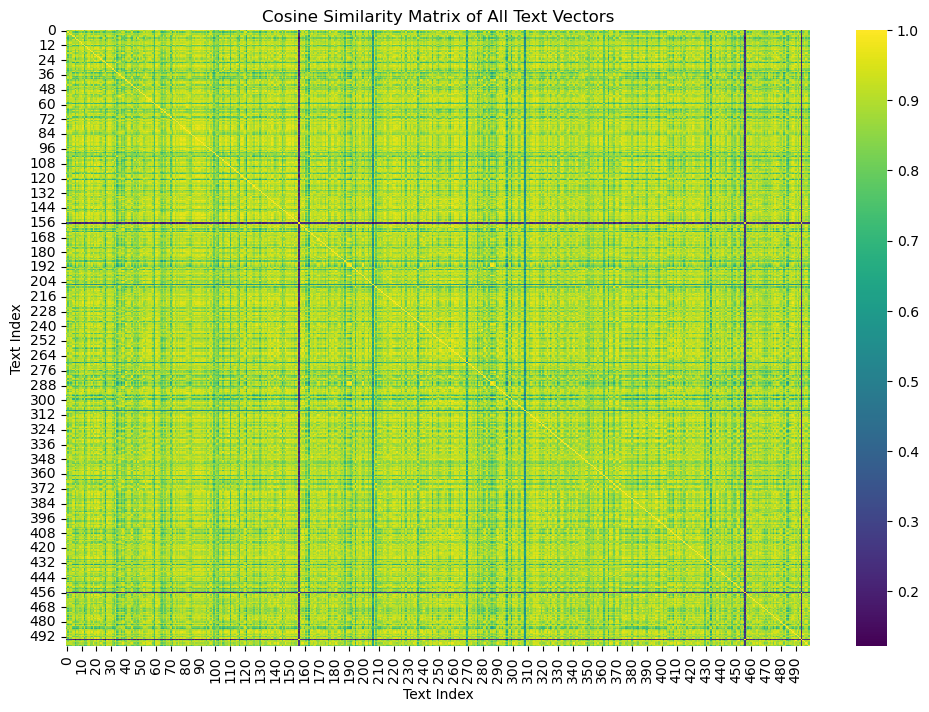


Average Cosine Similarity: 0.8673


In [201]:
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Extract all text vectors and convert to a matrix
text_vectors = np.vstack(df['text_vector_md'].values)

subset_vectors = text_vectors[:500]
similarity_matrix = cosine_similarity(subset_vectors)

# Plot heatmap of similarity matrix
plt.figure(figsize=(12, 8))
sns.heatmap(similarity_matrix, cmap='viridis')
plt.title("Cosine Similarity Matrix of All Text Vectors")
plt.xlabel("Text Index")
plt.ylabel("Text Index")
plt.show()

# Calculate the average cosine similarity (ignoring self-similarity which is always 1.0)
average_similarity = (np.sum(similarity_matrix) - np.trace(similarity_matrix)) / (similarity_matrix.size - len(similarity_matrix))

# Display the average cosine similarity
print(f"\nAverage Cosine Similarity: {average_similarity:.4f}")

In [195]:
nlp = spacy.load('es_core_news_lg')

def vectorise_text(text):
    doc = nlp(text)
    return doc.vector

df['text_vector_lg'] = df['clean_text'].apply(vectorise_text)

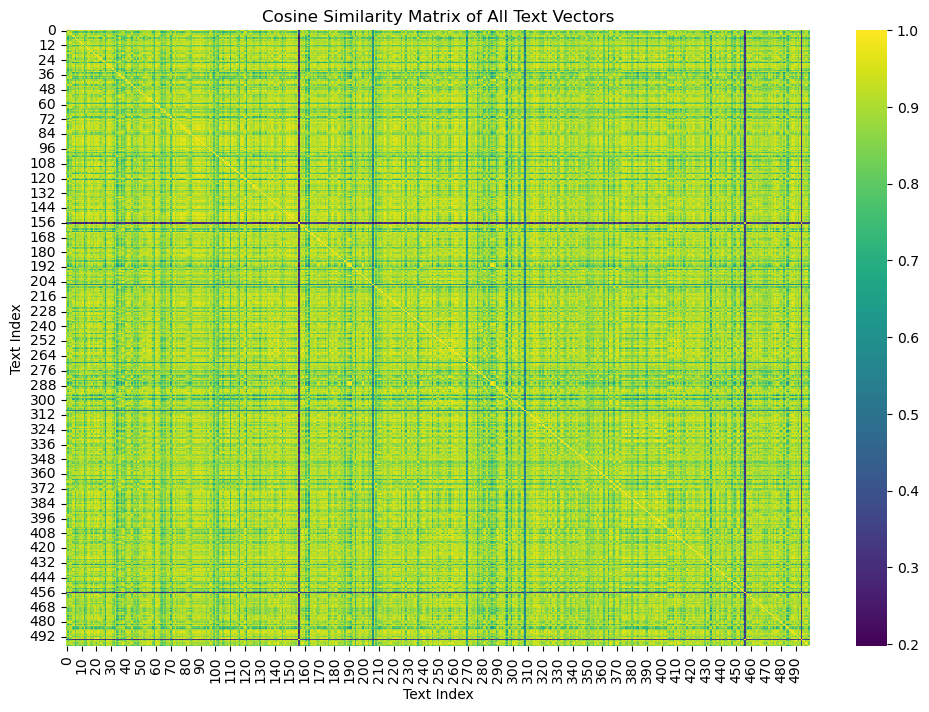


Average Cosine Similarity: 0.8704


In [202]:
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Extract all text vectors and convert to a matrix
text_vectors = np.vstack(df['text_vector_lg'].values)

subset_vectors = text_vectors[:500]
similarity_matrix = cosine_similarity(subset_vectors)


# Plot heatmap of similarity matrix
plt.figure(figsize=(12, 8))
sns.heatmap(similarity_matrix, cmap='viridis')
plt.title("Cosine Similarity Matrix of All Text Vectors")
plt.xlabel("Text Index")
plt.ylabel("Text Index")
plt.show()

# Calculate the average cosine similarity (ignoring self-similarity which is always 1.0)
average_similarity = (np.sum(similarity_matrix) - np.trace(similarity_matrix)) / (similarity_matrix.size - len(similarity_matrix))

# Display the average cosine similarity
print(f"\nAverage Cosine Similarity: {average_similarity:.4f}")

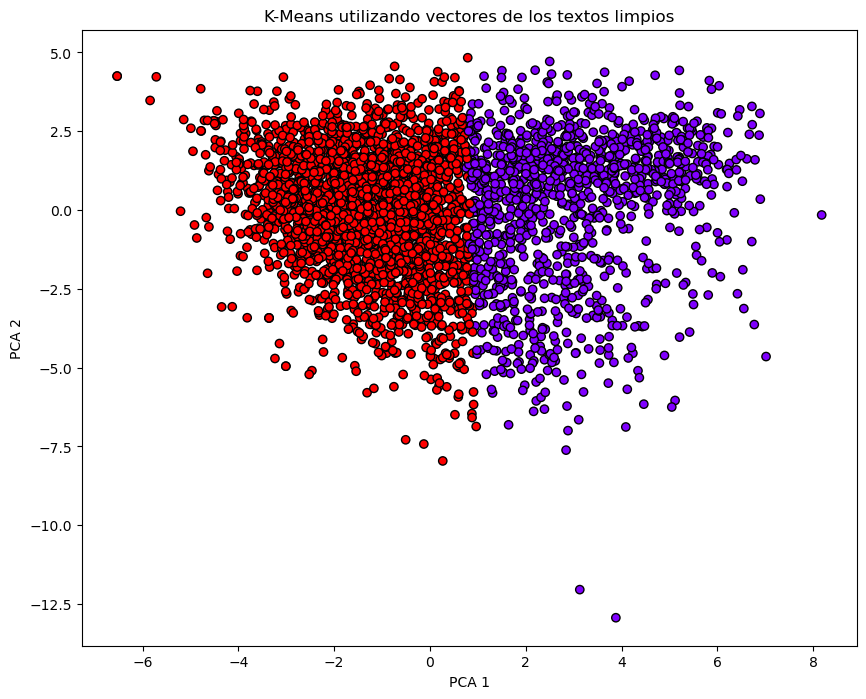

Silhouette Score: 0.18477673828601837
Davies-Bouldin Index: 2.0663628625983064
Calinski-Harabasz Score: 727.2481689453125
Inertia: 82641.53125


In [222]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import numpy as np
import matplotlib.pyplot as plt

# Clustering the articles using KMeans
def kmeans_cluster(df, n_clusters=2):
    # Extract the vectors from the DataFrame
    vectors = np.array(df['text_vector_md'].tolist())  # Convert list of vectors to NumPy array
    
    # Fit a KMeans object to the dataset
    kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(vectors)
    
    # Get the cluster labels
    df['cluster_text_vectors'] = kmeans.labels_
    
    # Get the inertia
    inertia = kmeans.inertia_
    
    return df, vectors, kmeans.labels_, inertia

# Cluster the articles
df, vectors, labels, inertia = kmeans_cluster(df, n_clusters=2)

# Plot the clusters
def plot_clusters(df, vectors):
    # Reduce the dimensions to 2D using PCA
    pca = PCA(n_components=2)
    reduced = pca.fit_transform(vectors)

    # Append the reduced dimensions to the DataFrame
    df['pca_x'] = reduced[:, 0]
    df['pca_y'] = reduced[:, 1]

    # Plot the clusters
    plt.figure(figsize=(10, 8))
    plt.scatter(df['pca_x'], df['pca_y'], c=df['cluster_text_vectors'], cmap='rainbow', edgecolors='k')
    plt.xlabel('PCA 1')
    plt.ylabel('PCA 2')
    plt.title('K-Means utilizando vectores de los textos limpios')
    plt.show()
    
    return reduced

reduced = plot_clusters(df, vectors)

# Calculate the silhouette score
def calculate_metrics(vectors, labels):
    # Calculate the silhouette score
    silhouette = silhouette_score(vectors, labels)
    
    # Calculate the Davies-Bouldin Index
    davies_bouldin = davies_bouldin_score(vectors, labels)
    
    # Calculate the Calinski-Harabasz Score
    calinski_harabasz = calinski_harabasz_score(vectors, labels)
    
    return silhouette, davies_bouldin, calinski_harabasz

# Calculate metrics
silhouette, davies_bouldin, calinski_harabasz = calculate_metrics(vectors, labels)
print(f"Silhouette Score: {silhouette}")
print(f"Davies-Bouldin Index: {davies_bouldin}")
print(f"Calinski-Harabasz Score: {calinski_harabasz}")
print(f"Inertia: {inertia}")


# Sentiment Analysis - VADER


In [4]:
# Option 1: Use a lexicon-based approach
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.corpus import stopwords
import nltk
nltk.download('vader_lexicon')
nltk.download('stopwords')

# Initialize VADER (note: primarily for English but sometimes works for Spanish)
sid = SentimentIntensityAnalyzer()

# Apply sentiment analysis
df['sentiment_score_vader'] = df['clean_text'].apply(
    lambda text: sid.polarity_scores(text)['compound'])

# Option 2: Simple lexicon-based approach with Spanish sentiment lexicons
# Load Spanish positive and negative words (you'll need to find a Spanish lexicon)
positive_words = set(open('spanish_positive_words.txt', 'r', encoding='utf-8').read().splitlines())
negative_words = set(open('spanish_negative_words.txt', 'r', encoding='utf-8').read().splitlines())

def simple_sentiment(text):
    words = text.split()
    pos_count = sum(1 for word in words if word in positive_words)
    neg_count = sum(1 for word in words if word in negative_words)
    
    if pos_count > neg_count:
        return 1
    elif neg_count > pos_count:
        return -1
    else:
        return 0

df['sentiment_score'] = df['clean_text'].apply(simple_sentiment)

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\jaysh\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\jaysh\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [5]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

analyzer = SentimentIntensityAnalyzer()

# Function to get sentiment score
def get_vader_sentiment(text):
    score = analyzer.polarity_scores(text)
    return score['compound']  # Range: [-1, 1]

df['sentiment_score_vader'] = df['clean_text'].apply(get_vader_sentiment)


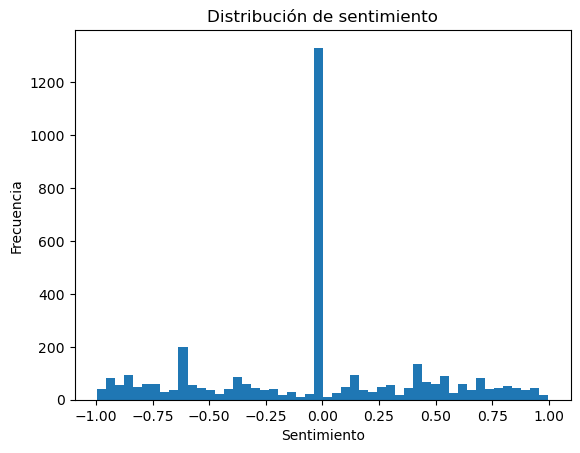

In [207]:
plot = df["sentiment_score_vader"].plot(kind='hist', bins=50, title="Distribución de sentimiento")
plot.set_xlabel("Sentimiento")      
plot.set_ylabel("Frecuencia")
plt.show()

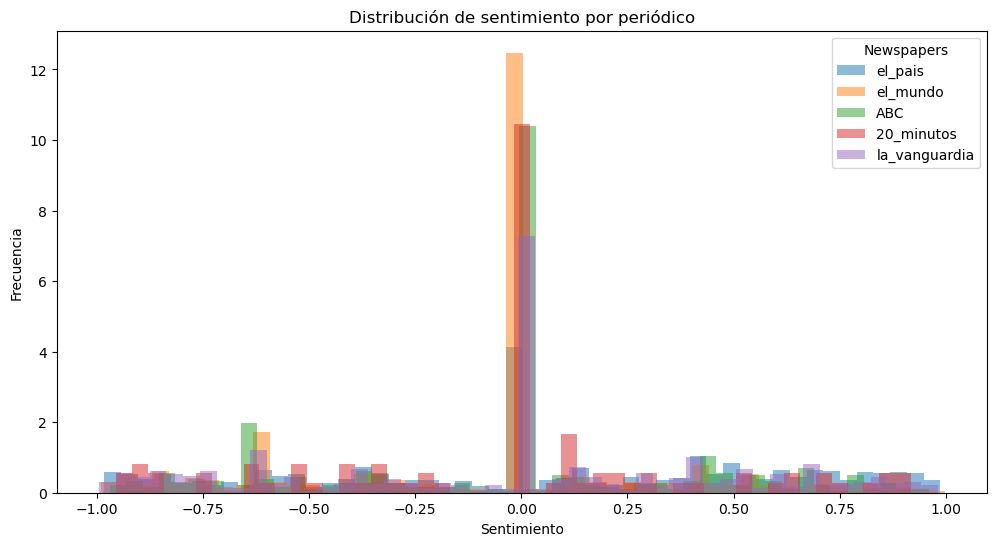

In [208]:
import matplotlib.pyplot as plt

def plot_combined_sentiment_distribution(df):
    newspapers = df['newspaper'].unique()  # Assuming your DataFrame has a 'newspaper' column
    
    plt.figure(figsize=(12, 6))
    
    for newspaper in newspapers:
        # Filter DataFrame by newspaper
        newspaper_df = df[df['newspaper'] == newspaper]
        
        # Plot histogram for each newspaper with transparency (alpha)
        plt.hist(newspaper_df["sentiment_score_vader"], bins=50, alpha=0.5, label=newspaper, density=True)
    
    # Plot settings
    plt.title("Distribución de sentimiento por periódico")	
    plt.xlabel("Sentimiento")
    plt.ylabel("Frecuencia")
    plt.legend(title="Newspapers")
    plt.show()

# Call the function to plot combined sentiment distributions
plot_combined_sentiment_distribution(df)


# Stance Analysis - TF-IDF

In [25]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer

# Pro-Immigration Lexicon
with open('spanish_positive_words.txt', 'r', encoding='utf-8') as file:
    pro_immigration_lexicon = file.read().splitlines()

# Anti-Immigration Lexicon
with open('spanish_negative_words.txt', 'r', encoding='utf-8') as file:
    anti_immigration_lexicon = file.read().splitlines()

# Assuming you have a DataFrame `df` with a column 'clean_text'
# Create the TF-IDF vectorizer and fit it to the clean text
tfidf_vectorizer = TfidfVectorizer()
tfidf_matrix = tfidf_vectorizer.fit_transform(df['clean_text'])
feature_names = tfidf_vectorizer.get_feature_names_out()  # List of words indexed by their position

# Function to calculate lexicon score
def get_lexicon_score(matrix, feature_names, lexicon):
    indices = [i for i, word in enumerate(feature_names) if word in lexicon]
    lexicon_matrix = matrix[:, indices]
    return lexicon_matrix.sum(axis=1)  # Sum of TF-IDF scores of words in the lexicon

# Calculate Pro-Immigration and Anti-Immigration Scores
df['pro_immigration_score'] = get_lexicon_score(tfidf_matrix, feature_names, pro_immigration_lexicon)
df['anti_immigration_score'] = get_lexicon_score(tfidf_matrix, feature_names, anti_immigration_lexicon)

# Print the first few rows to verify the results
print(df[['clean_text', 'pro_immigration_score', 'anti_immigration_score']].head())

                                          clean_text  pro_immigration_score  \
0  presidente joe biden terminando mandato todaví...               0.969493   
1  vida sucede línea recta veces enmaraña luchar ...               1.737239   
2  saliendo chicos mayores después tiempo centro ...               0.560590   
3  mismo día lalachus mostró estampa vaquilla gra...               0.797474   
4  primer disparo batalla donald trump ciudades s...               0.932482   

   anti_immigration_score  
0                0.644376  
1                1.638958  
2                1.342335  
3                0.560420  
4                1.256510  


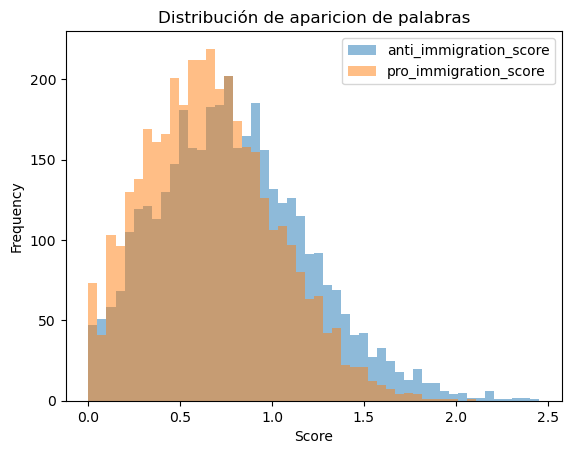

In [211]:
plot = df[["anti_immigration_score","pro_immigration_score"]].plot(kind='hist', bins=50, title="Distribución de aparicion de palabras", alpha=0.5)
plot.set_xlabel("Score")
plot.set_ylabel("Frequency")
plt.show()

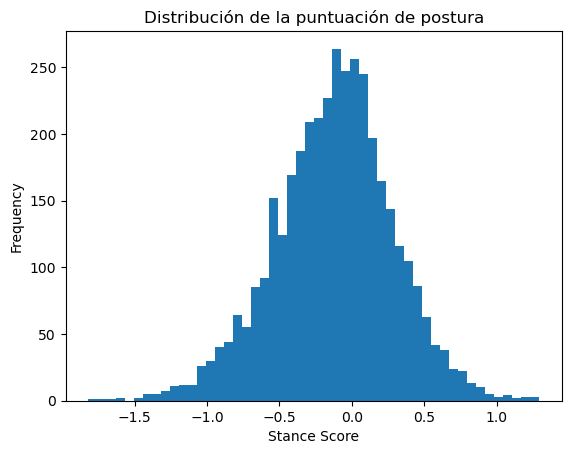

In [214]:
stance_score = df['pro_immigration_score']-df['anti_immigration_score']
df['stance_score'] = stance_score

#plot stance score distribution
plot = df["stance_score"].plot(kind='hist', bins=50, title="Distribución de la puntuación de postura")
plot.set_xlabel("Stance Score")
plot.set_ylabel("Frequency")
plt.show()

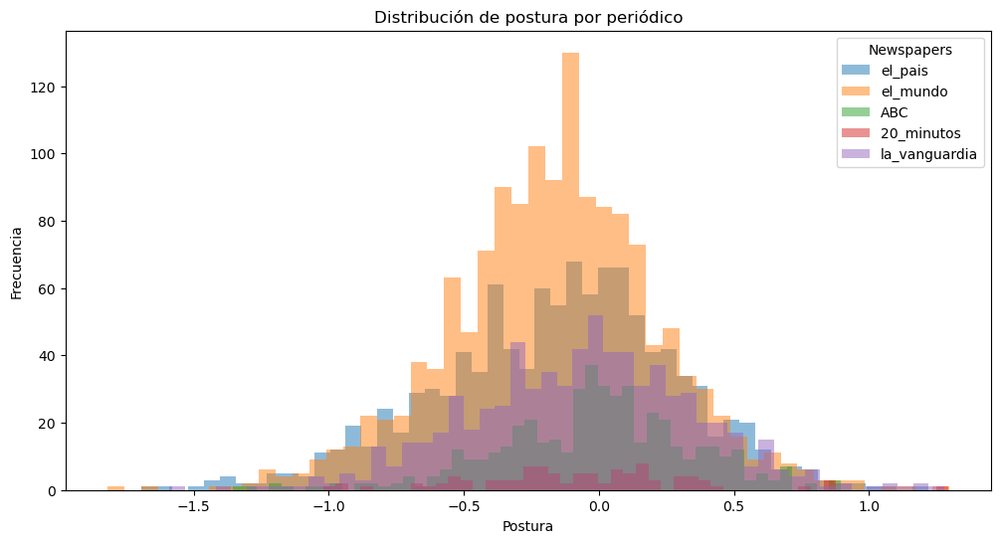

In [216]:
import matplotlib.pyplot as plt

def plot_combined_sentiment_distribution(df):
    newspapers = df['newspaper'].unique()  # Assuming your DataFrame has a 'newspaper' column
    
    plt.figure(figsize=(12, 6))
    
    for newspaper in newspapers:
        # Filter DataFrame by newspaper
        newspaper_df = df[df['newspaper'] == newspaper]
        
        # Plot histogram for each newspaper with transparency (alpha)
        plt.hist(newspaper_df["stance_score"], bins=50, alpha=0.5, label=newspaper)
    
    # Plot settings
    plt.title("Distribución de postura por periódico")	
    plt.xlabel("Postura")
    plt.ylabel("Frecuencia")
    plt.legend(title="Newspapers")
    plt.show()

# Call the function to plot combined sentiment distributions
plot_combined_sentiment_distribution(df)


# Clustering using Sentiment and Stance Labels - KMEANS 

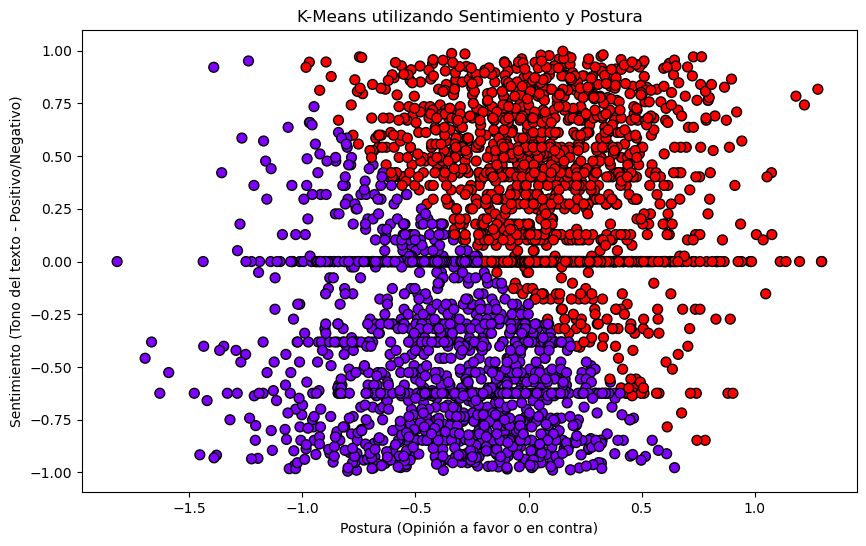

Silhouette Score: 0.5413
Davies-Bouldin Index: 0.6249
Calinski-Harabasz Score: 6498.8102
Inertia: 702.1558

Cluster 0 - Average Sentiment Score: -0.3756

Cluster 1 - Average Sentiment Score: 0.2643


In [223]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import matplotlib.pyplot as plt

# KMeans Clustering
features = (df["sentiment_score_vader"] + df["stance_score"]).values.reshape(-1, 1)
kmeans = KMeans(n_clusters=2, random_state=42).fit(features)
df["bias"] = kmeans.labels_

# Calculate Inertia
inertia = kmeans.inertia_

# Plot the clusters
plt.figure(figsize=(10, 6))
plt.scatter(df["stance_score"], df["sentiment_score_vader"], c=kmeans.labels_, cmap='rainbow', s=50, edgecolors='k')
plt.xlabel("Postura (Opinión a favor o en contra)")
plt.ylabel("Sentimiento (Tono del texto - Positivo/Negativo)")
plt.title("K-Means utilizando Sentimiento y Postura")
plt.show()

# Calculate Evaluation Metrics
silhouette_avg = silhouette_score(features, df["bias"])
davies_bouldin = davies_bouldin_score(features, df["bias"])
calinski_harabasz = calinski_harabasz_score(features, df["bias"])

# Display Metrics
print(f"Silhouette Score: {silhouette_avg:.4f}")
print(f"Davies-Bouldin Index: {davies_bouldin:.4f}")
print(f"Calinski-Harabasz Score: {calinski_harabasz:.4f}")
print(f"Inertia: {inertia:.4f}")

# Check Sentiment Distribution Per Cluster
for label in df['bias'].unique():
    cluster_sentiments = df[df['bias'] == label]['sentiment_score_vader']
    print(f"\nCluster {label} - Average Sentiment Score: {cluster_sentiments.mean():.4f}")


# USING THE WORD EMBEDDINGS AND THE FEATURES TO CLUSTER - KMEANS

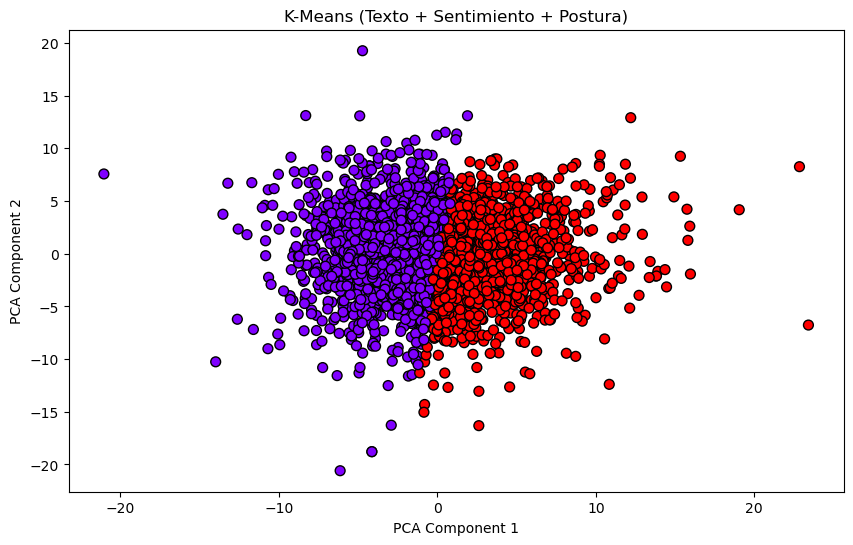

KMeans Silhouette Score: 0.0922
KMeans Davies-Bouldin Index: 2.8421
KMeans Calinski-Harabasz Score: 413.8799
KMeans Inertia: 338912.2506


In [224]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import matplotlib.pyplot as plt

# Step 1: Convert 'text_vectors' column to numpy array
text_vectors = np.array([vec.toarray().flatten() if hasattr(vec, 'toarray') else np.array(vec).flatten() for vec in df['text_vector'].tolist()])

# Check if all vectors have the same length
vector_lengths = [len(vec) for vec in text_vectors]
if len(set(vector_lengths)) != 1:
    raise ValueError("Not all vectors have the same length.")

# Step 2: Combine text vectors with other features
other_features = df[['sentiment_score_vader', 'stance_score']].values
combined_features = np.hstack([text_vectors, other_features])

# Step 3: Normalize the combined features
scaler = StandardScaler()
normalized_features = scaler.fit_transform(combined_features)

# Step 4: Apply KMeans clustering
kmeans = KMeans(n_clusters=2, random_state=42).fit(normalized_features)
df["stance_kmeans"] = kmeans.labels_

# Step 5: Calculate Inertia
inertia = kmeans.inertia_

# Step 6: Visualize KMeans clustering (Using PCA for dimensionality reduction)
pca = PCA(n_components=2)
reduced_features = pca.fit_transform(normalized_features)

plt.figure(figsize=(10, 6))
plt.scatter(reduced_features[:, 0], reduced_features[:, 1], c=kmeans.labels_, cmap='rainbow', s=50, edgecolor='k')
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.title("K-Means (Texto + Sentimiento + Postura)")
plt.show()

# Step 7: Calculate Evaluation Metrics
silhouette_avg_kmeans = silhouette_score(normalized_features, kmeans.labels_)
davies_bouldin_kmeans = davies_bouldin_score(normalized_features, kmeans.labels_)
calinski_harabasz_kmeans = calinski_harabasz_score(normalized_features, kmeans.labels_)

# Step 8: Display Evaluation Metrics
print(f"KMeans Silhouette Score: {silhouette_avg_kmeans:.4f}")
print(f"KMeans Davies-Bouldin Index: {davies_bouldin_kmeans:.4f}")
print(f"KMeans Calinski-Harabasz Score: {calinski_harabasz_kmeans:.4f}")
print(f"KMeans Inertia: {inertia:.4f}")


# N.E.R ANALYSIS

In [227]:
# Name Entity Recognition Analysis of the texts, count the number of entities in each text
import spacy
from collections import Counter

# Load the spaCy model
nlp = spacy.load("es_core_news_md")

# Function to extract entities from text
def extract_entities(text):
    doc = nlp(text)
    entities = [ent.text for ent in doc.ents]
    return entities

# Extract entities from each text
df['entities_text'] = df['clean_text'].apply(extract_entities)

# Count the number of entities in each text
df['num_entities'] = df['entities_text'].apply(len)

# Display the first few rows
print(df[['text', 'entities_text', 'num_entities']].head())


                                                text  \
0  El presidente Joe Biden está terminando su man...   
1  La vida no sucede en línea recta. A veces, tod...   
2  “Están saliendo chicos mayores después de esta...   
3  El mismo día que Lalachus mostró la estampa de...   
4  El primer disparo de la batalla de Donald Trum...   

                                       entities_text  num_entities  
0  [joe biden, donald trump, caracas, nicolás mad...            13  
1  [madrid años victoria, zaragoza distancias, pé...            13  
2  [lorena morales, psoe, madrid, elena gil, espa...            15  
3  [lalachus, jesús, mahmoud, sevilla, mahmoud, l...            12  
4  [donald trump, stephen miller, nueva york, chi...            10  


In [230]:
print(df.columns)

Index(['id', 'title', 'publish_date', 'text', 'outlier', 'truncated_text',
       'tokens', 'clean_text', 'clean_title', 'newspaper', 'url',
       'sentiment_score_vader', 'sentiment_score', 'sentiment_score_spanish',
       'pro_immigration_score', 'anti_immigration_score', 'stance_score',
       'stance', 'text_vector', 'cluster', 'cluster_text_vectors', 'pca_x',
       'pca_y', 'dbscan_text_vectors', 'stance_dbscan', 'stance_kmeans',
       'dbscan_sentiment_stance', 'entities', 'num_entities',
       'num_entities_title', 'entities_kmeans', 'combined_kmeans', 'bias',
       'entities_text', 'entities_title', 'persons', 'locations',
       'organizations', 'entities_combined', 'person_score', 'location_score',
       'organization_score', 'entity_vector', 'text_vector_md',
       'text_vector_lg'],
      dtype='object')


In [219]:
# Name Entity Recognition Analysis of the texts, count the number of entities in each text
import spacy
from collections import Counter

# Load the spaCy model
nlp = spacy.load("es_core_news_md")

# Function to extract entities from text
def extract_entities(text):
    doc = nlp(text)
    entities = [ent.text for ent in doc.ents]
    return entities

# Extract entities from each text
df['entities_title'] = df['clean_title'].apply(extract_entities)

# Count the number of entities in each text
df['num_entities_title'] = df['entities_title'].apply(len)

# Display the first few rows
print(df[['title', 'entities_title', 'num_entities_title']].head())


                                               title         entities_title  \
0  Biden extiende por 18 meses el estatus de prot...                [biden]   
1  Paloma Sánchez-Garnica: “Un escritor no puede ...                     []   
2  De ser un niño tutelado por Madrid, a cumplir ...     [ser niño, madrid]   
3                          Se llamaba Mahmoud Bakhum       [mahmoud bakhum]   
4  La guerra de Donald Trump contra las ciudades ...  [guerra donald trump]   

   num_entities_title  
0                   1  
1                   0  
2                   2  
3                   1  
4                   1  


Kmeans

In [123]:
print(df.columns)

Index(['id', 'title', 'publish_date', 'text', 'outlier', 'truncated_text',
       'tokens', 'clean_text', 'clean_title', 'newspaper', 'url',
       'sentiment_score_vader', 'sentiment_score', 'sentiment_score_spanish',
       'pro_immigration_score', 'anti_immigration_score', 'stance_score',
       'stance', 'text_vector', 'cluster', 'cluster_text_vectors', 'pca_x',
       'pca_y', 'dbscan_text_vectors', 'stance_dbscan', 'stance_kmeans',
       'dbscan_sentiment_stance', 'entities', 'num_entities',
       'num_entities_title', 'entities_kmeans', 'combined_kmeans', 'bias',
       'entities_text', 'entities_title'],
      dtype='object')


In [220]:
# Function to Extract Named Entities
import spacy
nlp = spacy.load("es_core_news_md")

def extract_entities(title, text):
    combined_text = title + " " + text
    doc = nlp(combined_text)
    persons = [ent.text for ent in doc.ents if ent.label_ == "PER"]
    locations = [ent.text for ent in doc.ents if ent.label_ == "LOC"]
    organizations = [ent.text for ent in doc.ents if ent.label_ == "ORG"]
    
    return persons, locations, organizations

# Apply function to all articles
df["persons"], df["locations"], df["organizations"] = zip(*df.apply(lambda row: extract_entities(row['clean_title'], row['clean_text']), axis=1))

# Print first 10 results
print(df[["text", "persons", "locations", "organizations"]].head(10))

                                                text  \
0  El presidente Joe Biden está terminando su man...   
1  La vida no sucede en línea recta. A veces, tod...   
2  “Están saliendo chicos mayores después de esta...   
3  El mismo día que Lalachus mostró la estampa de...   
4  El primer disparo de la batalla de Donald Trum...   
5  La Cámara de Representantes aprobó el martes u...   
6  Rescate de una madre migrante y su hijo nacido...   
7  Los refugios y organizaciones que brindan aten...   
8  El Papa Francisco ha elegido al cardenal Rober...   
9  Los niños migrantes en México son cada vez más...   

                                             persons  \
0  [biden, joe biden, donald trump, nicolás madur...   
1  [zaragoza distancias, pérez galdós, javier cer...   
2  [lorena morales, elena gil, lorena, adolfo rod...   
3  [mahmoud bakhum, lalachus, jesús, mahmoud, mah...   
4  [guerra donald trump, donald trump, stephen mi...   
5  [donald trump, josé antonio ibarra, john fet

WORD CLOUD FOR ENTITITES

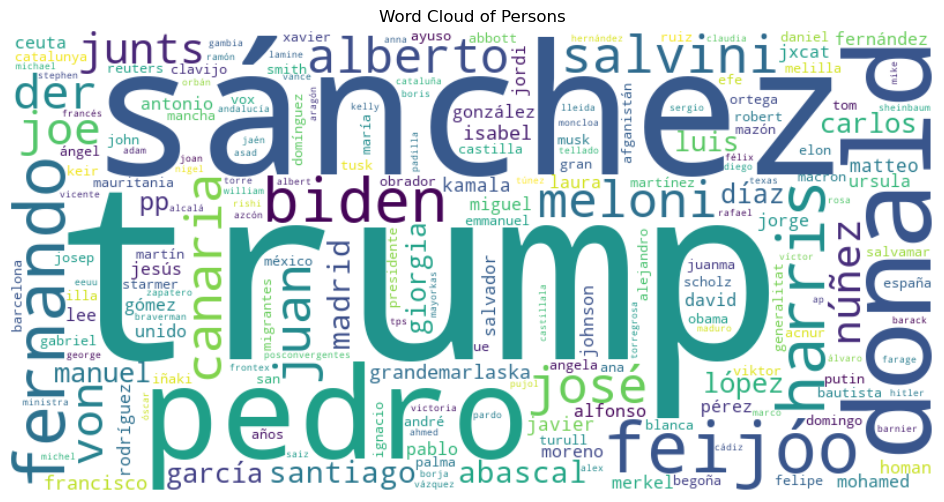

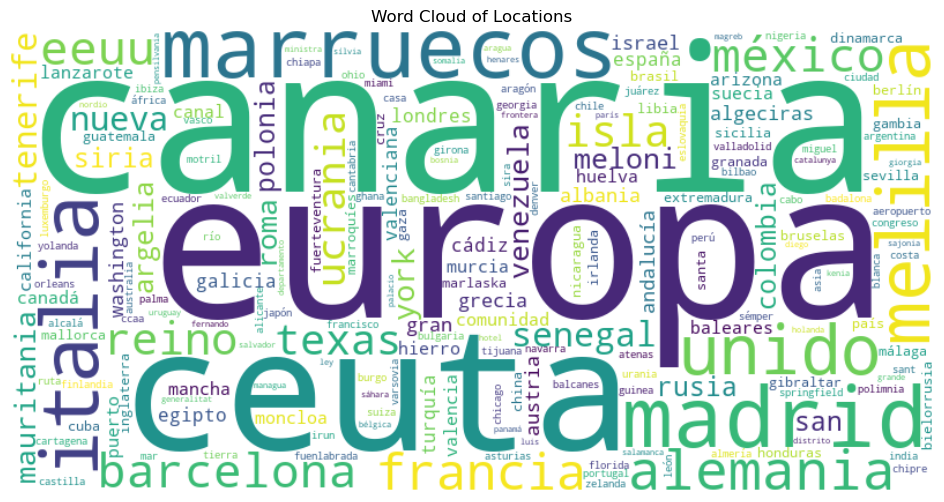

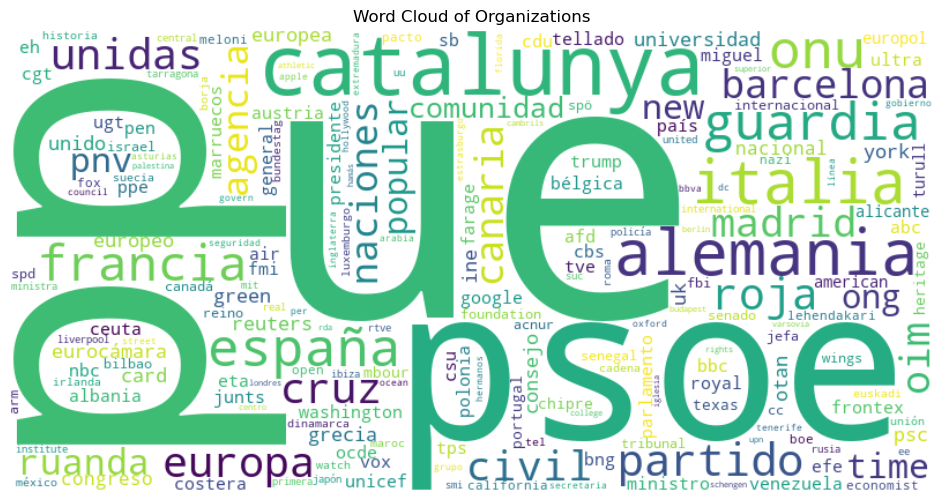

In [221]:
import string
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def normalize_entities(entity_list):
    # Convert all entities to lowercase and remove punctuation
    normalized_list = [entity.lower().strip(string.punctuation) for entity in entity_list]
    return normalized_list

def plot_wordcloud(df, entity_column, entity_type):
    all_entities = [item for sublist in df[entity_column] for item in sublist]
    normalized_entities = normalize_entities(all_entities)  # Normalize entities
    text = ' '.join(normalized_entities)
    
    wordcloud = WordCloud(width=800, height=400, background_color='white', collocations=False).generate(text)
    
    plt.figure(figsize=(12, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Word Cloud of {entity_type}")
    plt.show()

# Plot Word Clouds with Normalization
plot_wordcloud(df, 'persons', 'Persons')
plot_wordcloud(df, 'locations', 'Locations')
plot_wordcloud(df, 'organizations', 'Organizations')



Generating Word Cloud for Newspaper: el_pais


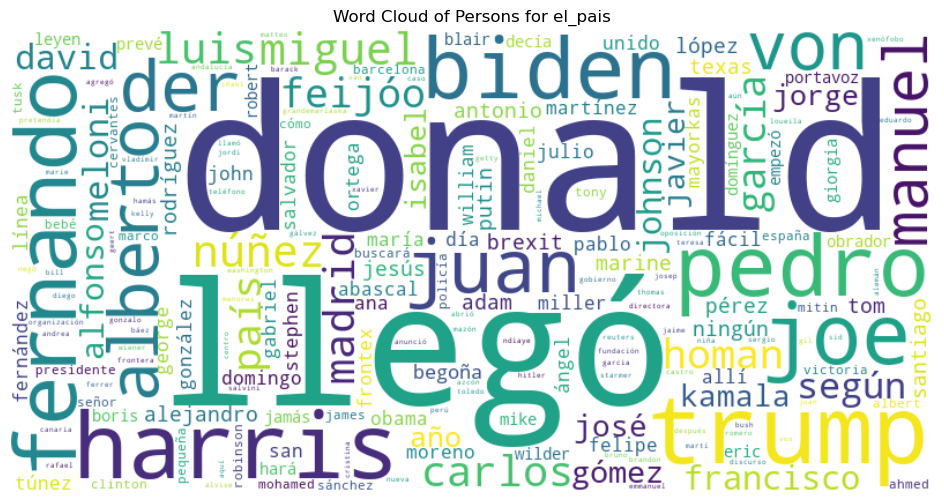


Generating Word Cloud for Newspaper: el_mundo


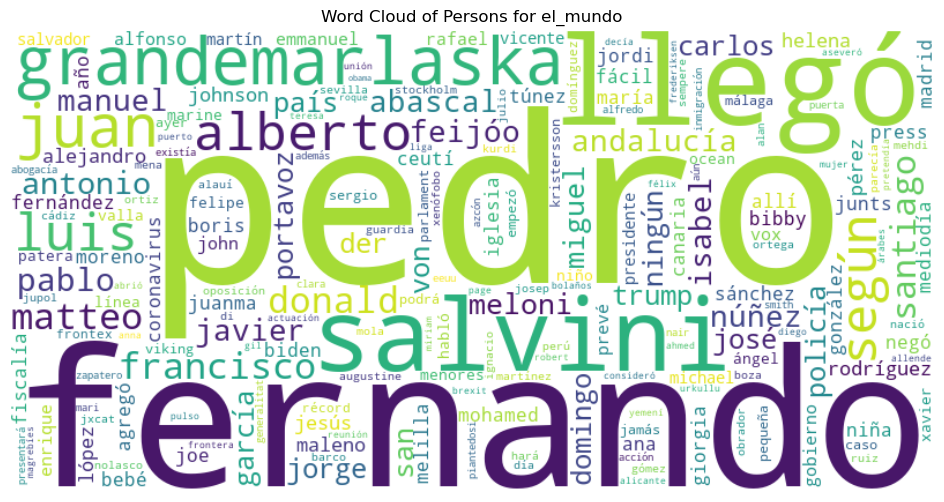


Generating Word Cloud for Newspaper: ABC


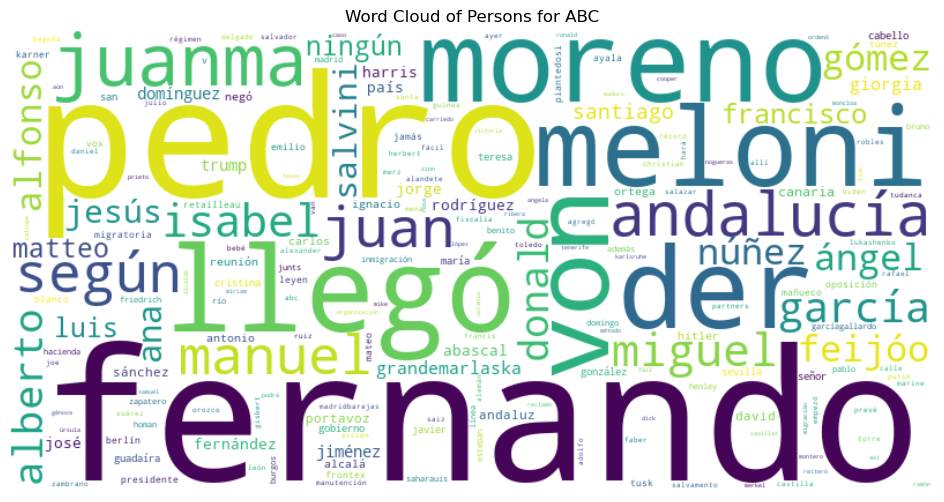


Generating Word Cloud for Newspaper: 20_minutos


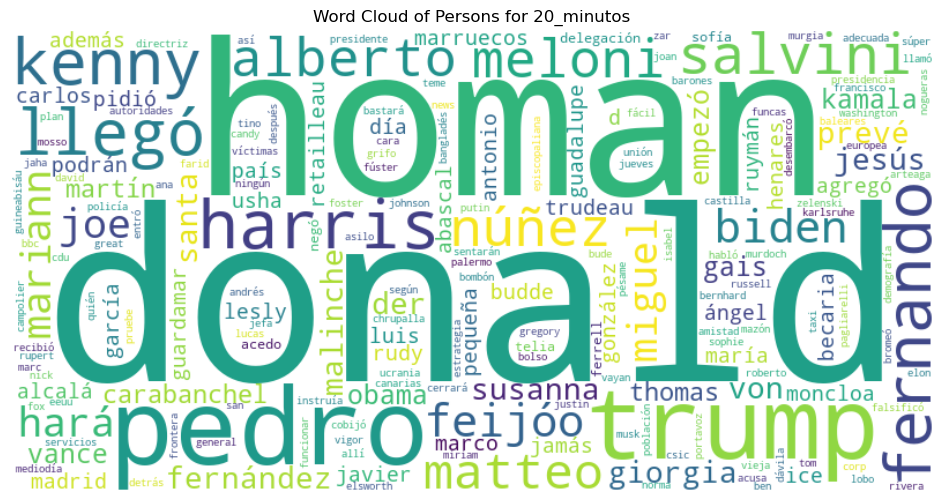


Generating Word Cloud for Newspaper: la_vanguardia


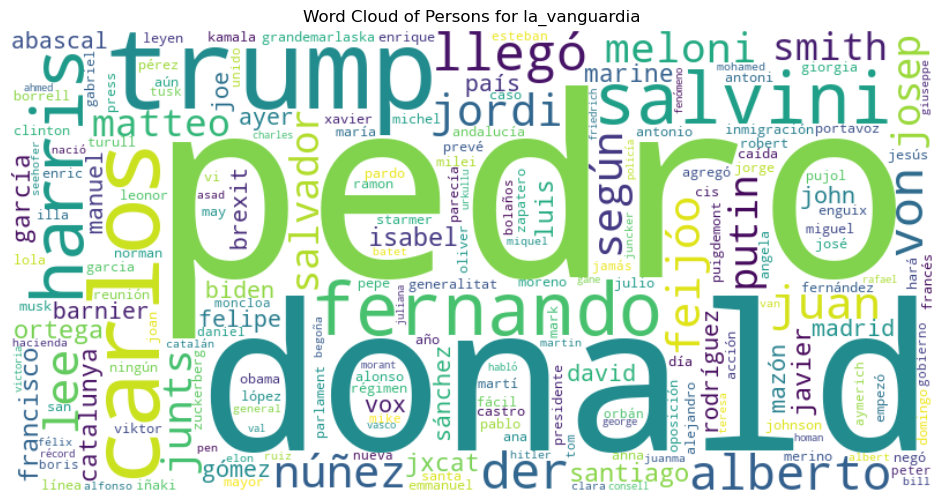


Generating Word Cloud for Newspaper: el_pais


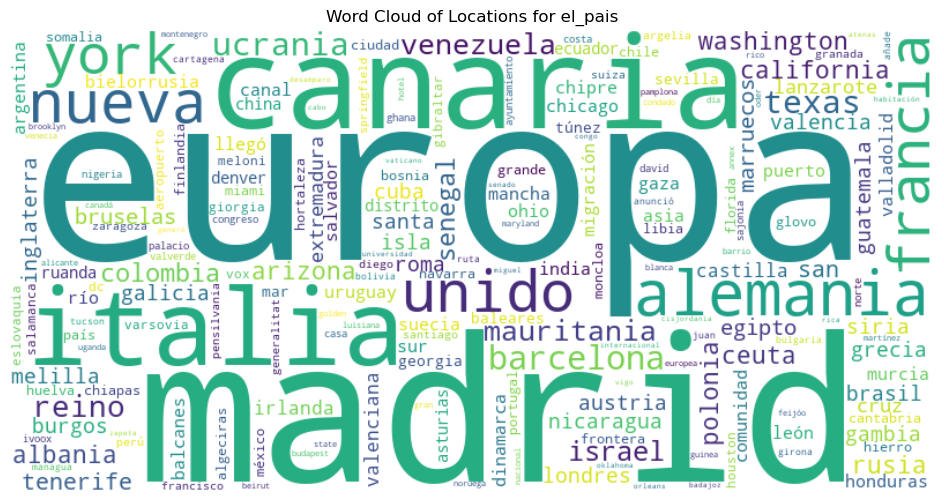


Generating Word Cloud for Newspaper: el_mundo


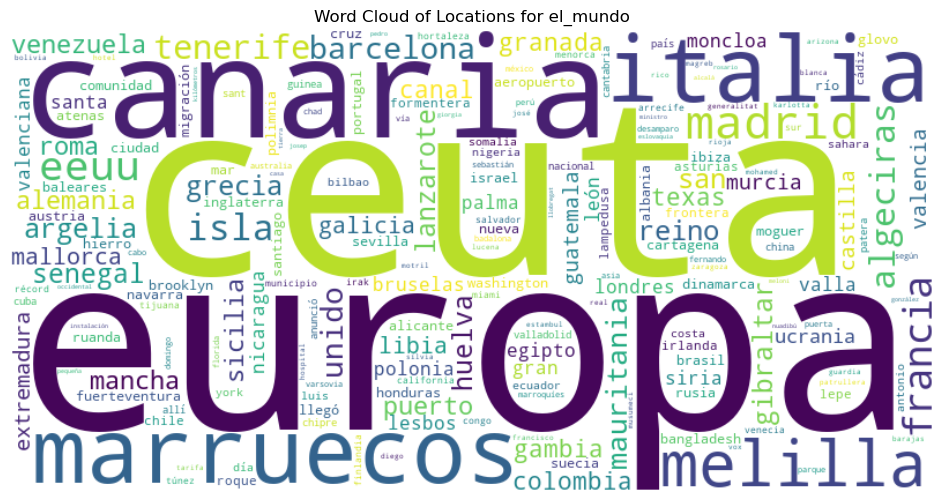


Generating Word Cloud for Newspaper: ABC


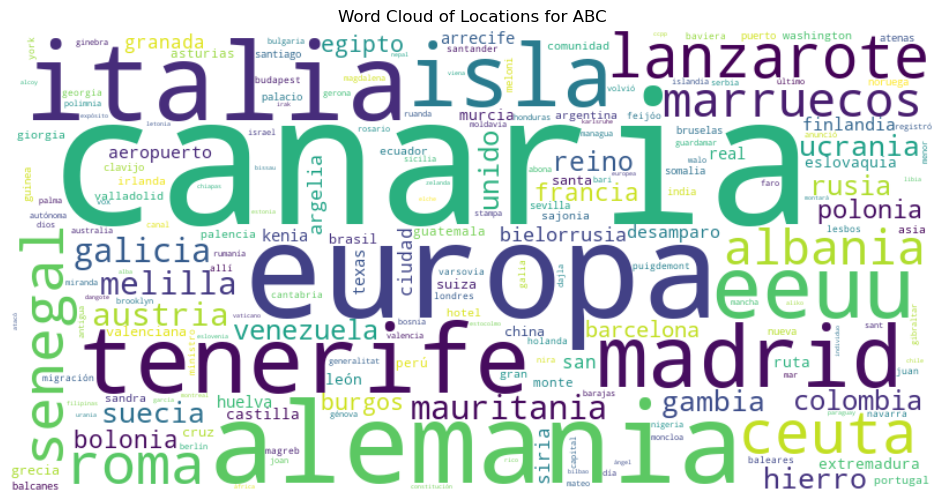


Generating Word Cloud for Newspaper: 20_minutos


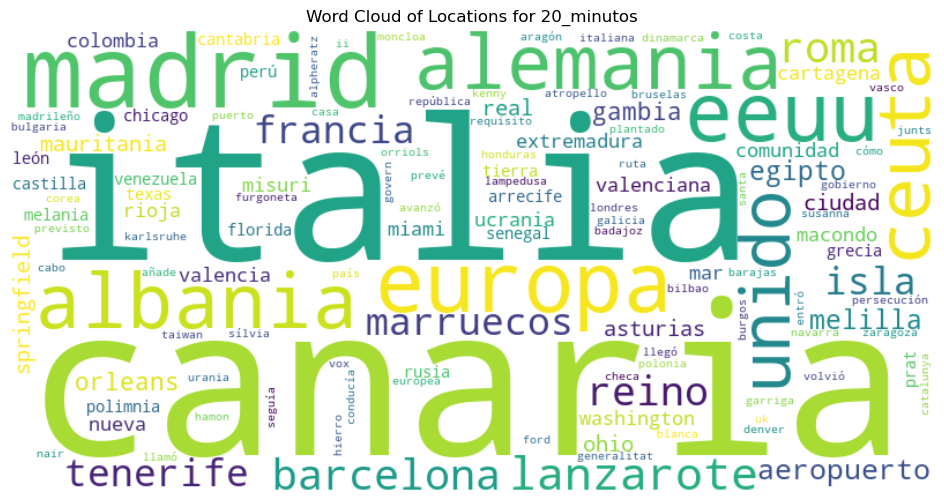


Generating Word Cloud for Newspaper: la_vanguardia


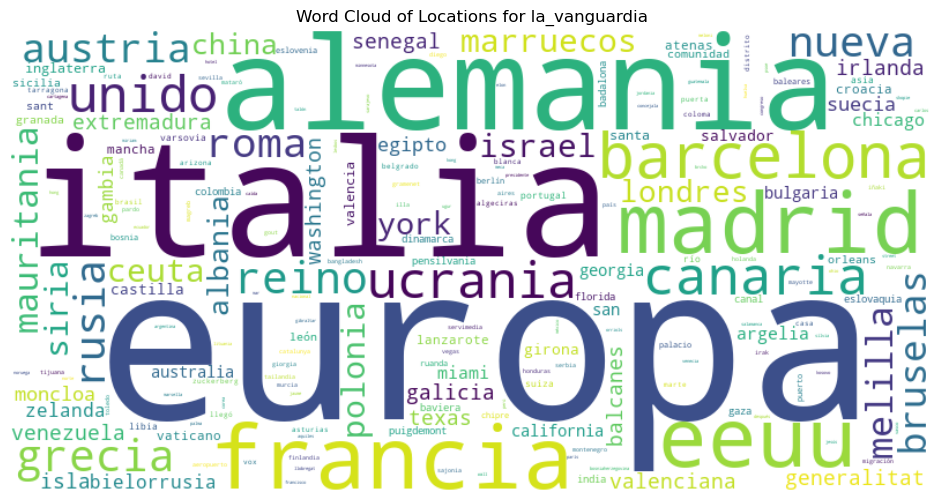


Generating Word Cloud for Newspaper: el_pais


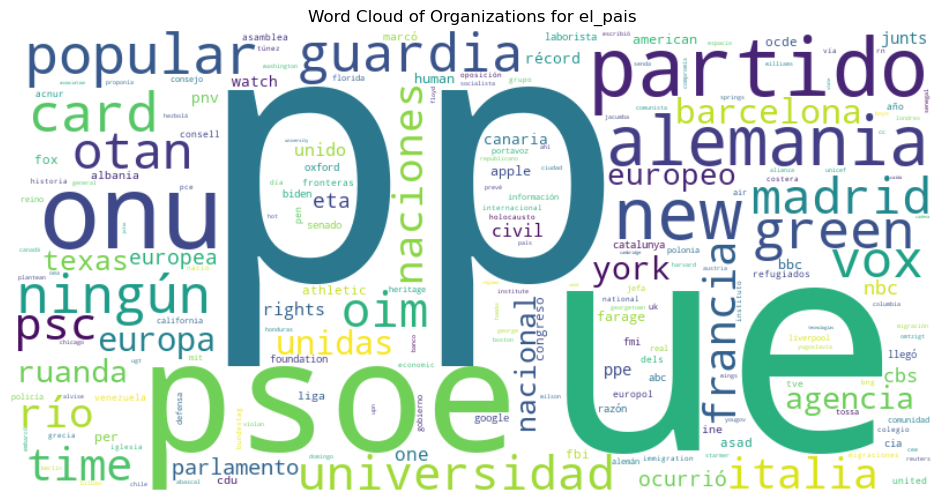


Generating Word Cloud for Newspaper: el_mundo


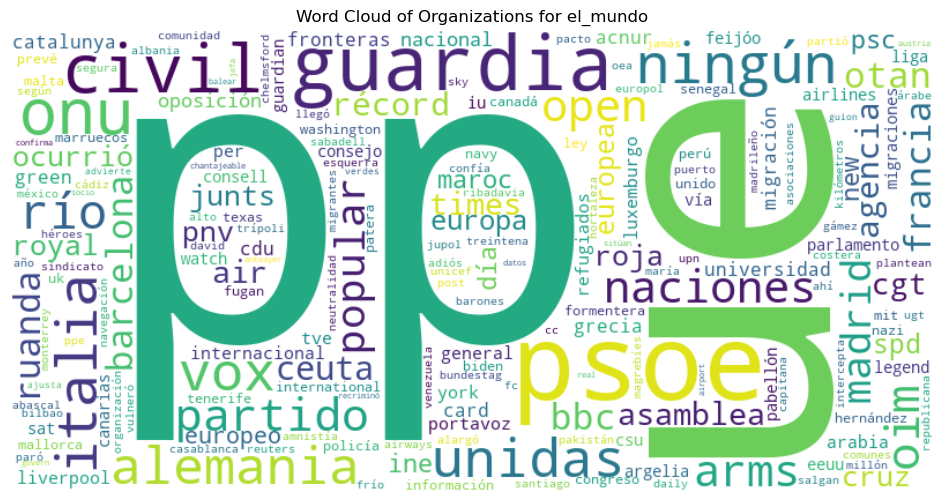


Generating Word Cloud for Newspaper: ABC


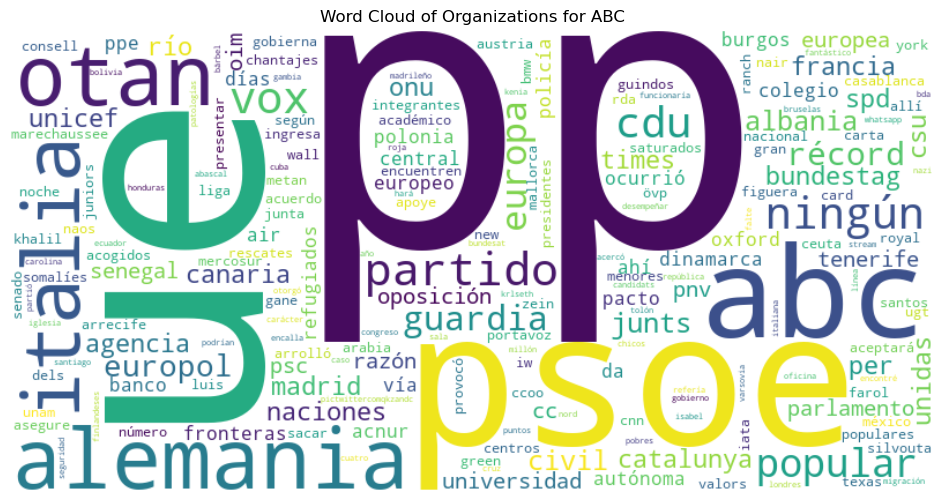


Generating Word Cloud for Newspaper: 20_minutos


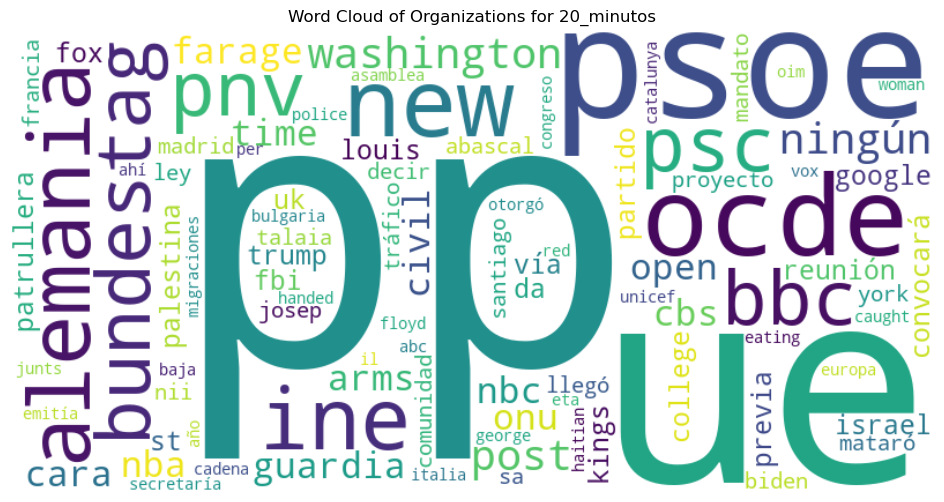


Generating Word Cloud for Newspaper: la_vanguardia


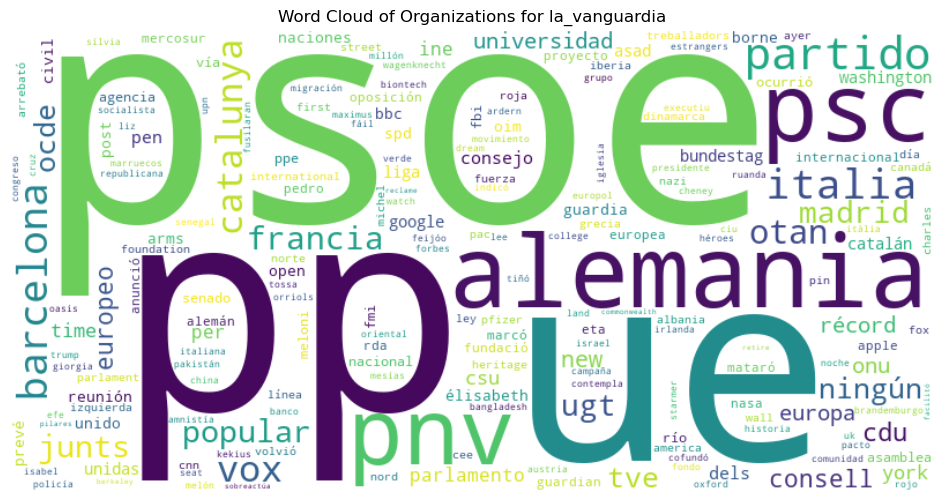

In [178]:
import string
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def normalize_entities(entity_list):
    # Convert all entities to lowercase and remove punctuation
    normalized_list = [entity.lower().strip(string.punctuation) for entity in entity_list]
    return normalized_list

def plot_wordcloud(df, entity_column, entity_type, newspaper_name):
    all_entities = [item for sublist in df[entity_column] for item in sublist]
    normalized_entities = normalize_entities(all_entities)  # Normalize entities
    text = ' '.join(normalized_entities)
    
    wordcloud = WordCloud(width=800, height=400, background_color='white', collocations=False).generate(text)
    
    plt.figure(figsize=(12, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Word Cloud of {entity_type} for {newspaper_name}")
    plt.show()

# Generate Word Clouds for Each Newspaper
def plot_wordclouds_by_newspaper(df, entity_column, entity_type):
    newspapers = df['newspaper'].unique()  # Assuming your DataFrame has a 'newspaper' column
    
    for newspaper in newspapers:
        print(f"\nGenerating Word Cloud for Newspaper: {newspaper}")
        newspaper_df = df[df['newspaper'] == newspaper]
        plot_wordcloud(newspaper_df, entity_column, entity_type, newspaper)

# Plot Word Clouds with Normalization for each newspaper
plot_wordclouds_by_newspaper(df, 'persons', 'Persons')
plot_wordclouds_by_newspaper(df, 'locations', 'Locations')
plot_wordclouds_by_newspaper(df, 'organizations', 'Organizations')


# ALL FEATURES COMBINES



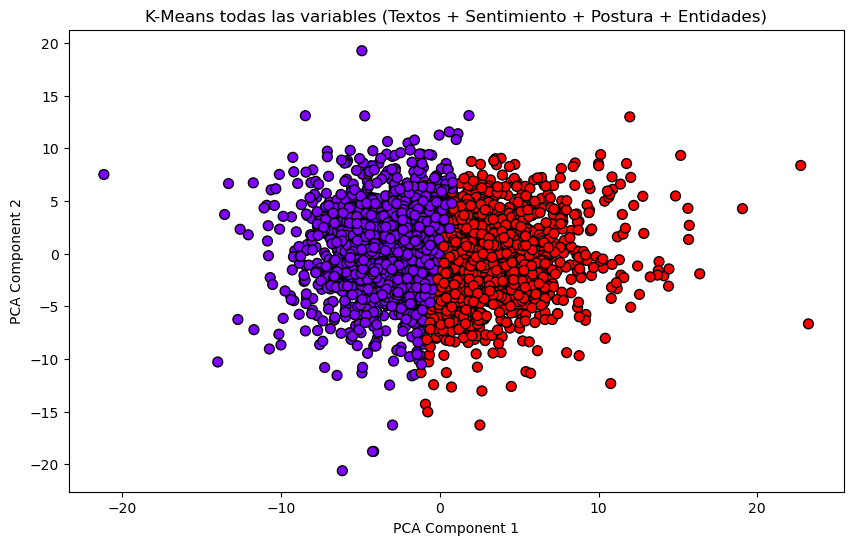

KMeans Silhouette Score: 0.0913
KMeans Davies-Bouldin Index: 2.8678
KMeans Calinski-Harabasz Score: 409.7782
KMeans Inertia: 346163.3893


In [225]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import matplotlib.pyplot as plt

# Step 1: Convert 'text_vectors' column to numpy array
text_vectors = np.array([vec.toarray().flatten() if hasattr(vec, 'toarray') else np.array(vec).flatten() for vec in df['text_vector'].tolist()])

# Check if all vectors have the same length
vector_lengths = [len(vec) for vec in text_vectors]
if len(set(vector_lengths)) != 1:
    raise ValueError("Not all vectors have the same length.")

# Step 2: Combine text vectors with other features
other_features = df[['sentiment_score_vader', 'stance_score', 'num_entities', 'num_entities_title']].values
combined_features = np.hstack([text_vectors, other_features])

# Step 3: Normalize the combined features
scaler = StandardScaler()
normalized_features = scaler.fit_transform(combined_features)

# Step 4: Apply KMeans clustering
kmeans = KMeans(n_clusters=2, random_state=42).fit(normalized_features)
df["stance_kmeans"] = kmeans.labels_

# Step 5: Calculate Inertia
inertia = kmeans.inertia_

# Step 6: Visualize KMeans clustering (Using PCA for dimensionality reduction)
pca = PCA(n_components=2)
reduced_features = pca.fit_transform(normalized_features)

plt.figure(figsize=(10, 6))
plt.scatter(reduced_features[:, 0], reduced_features[:, 1], c=kmeans.labels_, cmap='rainbow', s=50, edgecolor='k')
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.title("K-Means todas las variables (Textos + Sentimiento + Postura + Entidades)")
plt.show()

# Step 7: Calculate Evaluation Metrics
silhouette_avg_kmeans = silhouette_score(normalized_features, kmeans.labels_)
davies_bouldin_kmeans = davies_bouldin_score(normalized_features, kmeans.labels_)
calinski_harabasz_kmeans = calinski_harabasz_score(normalized_features, kmeans.labels_)

# Step 8: Display Evaluation Metrics
print(f"KMeans Silhouette Score: {silhouette_avg_kmeans:.4f}")
print(f"KMeans Davies-Bouldin Index: {davies_bouldin_kmeans:.4f}")
print(f"KMeans Calinski-Harabasz Score: {calinski_harabasz_kmeans:.4f}")
print(f"KMeans Inertia: {inertia:.4f}")


# DEEPER ANALYSIS USING STANCE AND SENTIMENT
Given the Silhouette Scores, Davies-Bouldin Index and Calinski-Harabasz scores for all the different clusters it is safe to say that the sentiment and stance analysis are the key variables to classify articles into bias and not bias

Identification of the cluster representation

In [147]:
# Analyse clusters for bias
# Check Sentiment Distribution Per Cluster
for label in df['bias'].unique():
    cluster_sentiments = df[df['bias'] == label]['sentiment_score_vader']
    print(f"\nCluster {label} - Average Sentiment Score: {cluster_sentiments.mean():.4f}")

print('-'*50)
# Check Stance Distribution Per Cluster
for label in df['bias'].unique():
    cluster_stances = df[df['bias'] == label]['stance_score']
    print(f"\nCluster {label} - Average Stance Score: {cluster_stances.mean():.4f}")



#Identify the most common words per cluster
from collections import Counter

# Function to get the most common words in a text
def get_most_common_words(text, top_n=5):
    words = text.split()
    word_counts = Counter(words)
    return word_counts.most_common(top_n)

# Get the most common words in each cluster
for label in df['bias'].unique():
    cluster_text = ' '.join(df[df['bias'] == label]['clean_text'])
    most_common_words = get_most_common_words(cluster_text)
    print(f"\nMost Common Words in Cluster {label}: {most_common_words}")

# Function to get the most common entities in a text
def get_most_common_entities(entities, top_n=5):
    all_entities = [item for sublist in entities for item in sublist]
    entity_counts = Counter(all_entities)
    return entity_counts.most_common(top_n)

# Get the most common entities in each cluster
for label in df['bias'].unique():
    cluster_entities = df[df['bias'] == label]['entities_text']
    most_common_entities = get_most_common_entities(cluster_entities)
    print(f"\nMost Common Entities in Cluster {label}: {most_common_entities}")





Cluster 0 - Average Sentiment Score: -0.3756

Cluster 1 - Average Sentiment Score: 0.2643
--------------------------------------------------

Cluster 0 - Average Stance Score: -0.3828

Cluster 1 - Average Stance Score: 0.0965

Most Common Words in Cluster 0: [('personas', 3609), ('gobierno', 2727), ('inmigrantes', 2423), ('migrantes', 2392), ('país', 2162)]

Most Common Words in Cluster 1: [('gobierno', 3630), ('personas', 2985), ('inmigración', 2638), ('si', 2552), ('inmigrantes', 2482)]

Most Common Entities in Cluster 0: [('europa', 758), ('ue', 500), ('italia', 431), ('pp', 426), ('canarias', 330)]

Most Common Entities in Cluster 1: [('pp', 1081), ('europa', 750), ('psoe', 566), ('ue', 473), ('madrid', 465)]


In [251]:
# Check Sentiment Distribution Per Cluster
bias_summary = []
for label in df['bias'].unique():
    cluster_sentiments = df[df['bias'] == label]['sentiment_score_vader']
    cluster_stances = df[df['bias'] == label]['stance_score']
    
    # Calculate mean scores
    avg_sentiment = cluster_sentiments.mean()
    avg_stance = cluster_stances.mean()
    
    # Identify which cluster is biased based on high absolute scores
    sentiment_bias = "Biased" if abs(avg_sentiment) > 0.3 else "Not Biased"
    stance_bias = "Biased" if abs(avg_stance) > 0.3 else "Not Biased"
    
    # Append results to the summary list
    bias_summary.append({
        "Cluster": label,
        "Average Sentiment Score": round(avg_sentiment, 4),
        "Average Stance Score": round(avg_stance, 4),
        "Sentiment Bias Status": sentiment_bias,
        "Stance Bias Status": stance_bias
    })
    
    # Print individual cluster summary
    print(f"\nCluster {label} - Average Sentiment Score: {avg_sentiment:.4f}")
    print(f"Cluster {label} - Average Stance Score: {avg_stance:.4f}")
    print(f"Sentiment Bias Status: {sentiment_bias}")
    print(f"Stance Bias Status: {stance_bias}")


Cluster 0 - Average Sentiment Score: -0.3756
Cluster 0 - Average Stance Score: -0.3828
Sentiment Bias Status: Biased
Stance Bias Status: Biased

Cluster 1 - Average Sentiment Score: 0.2643
Cluster 1 - Average Stance Score: 0.0965
Sentiment Bias Status: Not Biased
Stance Bias Status: Not Biased


In [241]:
import spacy
from collections import Counter

# Load the SpaCy Spanish model
nlp = spacy.load("es_core_news_md")
nlp.max_length = 5000000  # Increase the maximum length limit

# Function to extract adjectives and adverbs from chunks of text
def extract_adjectives_adverbs(text):
    filtered_words = []
    chunk_size = 50000  # Process text in chunks to avoid memory issues
    for i in range(0, len(text), chunk_size):
        doc = nlp(text[i:i + chunk_size])
        filtered_words.extend([token.text for token in doc if token.pos_ in ['ADJ', 'ADV']])
    return filtered_words

# Function to get filtered word counts
def get_filtered_word_counts(text):
    filtered_words = extract_adjectives_adverbs(text)
    return Counter(filtered_words)

# Get filtered word counts for each cluster
cluster_0_text = ' '.join(df[df['bias'] == 0]['clean_text'])
cluster_1_text = ' '.join(df[df['bias'] == 1]['clean_text'])

cluster_0_filtered_words = get_filtered_word_counts(cluster_0_text)
cluster_1_filtered_words = get_filtered_word_counts(cluster_1_text)

# Find unique filtered words per cluster
def get_unique_filtered_words(cluster_0_words, cluster_1_words):
    unique_cluster_0 = {word: count for word, count in cluster_0_words.items() if word not in cluster_1_words}
    unique_cluster_1 = {word: count for word, count in cluster_1_words.items() if word not in cluster_0_words}
    return unique_cluster_0, unique_cluster_1

unique_filtered_words_0, unique_filtered_words_1 = get_unique_filtered_words(cluster_0_filtered_words, cluster_1_filtered_words)

# Display most common adjectives and adverbs unique to each cluster
print("\nUnique Adjectives & Adverbs in Cluster 0:")
print(Counter(unique_filtered_words_0).most_common(10))

print("\nUnique Adjectives & Adverbs in Cluster 1:")
print(Counter(unique_filtered_words_1).most_common(10))



Unique Adjectives & Adverbs in Cluster 0:
[('seehofer', 18), ('antiterrorista', 17), ('mocejón', 14), ('esclavos', 13), ('panameño', 13), ('escif', 12), ('mortífero', 10), ('iom', 10), ('bulos', 9), ('perecido', 9)]

Unique Adjectives & Adverbs in Cluster 1:
[('supervisor', 16), ('glovo', 16), ('repartidores', 12), ('furió', 12), ('burgos', 10), ('satisfecha', 10), ('icps', 10), ('muti', 10), ('fáil', 10), ('emst', 10)]


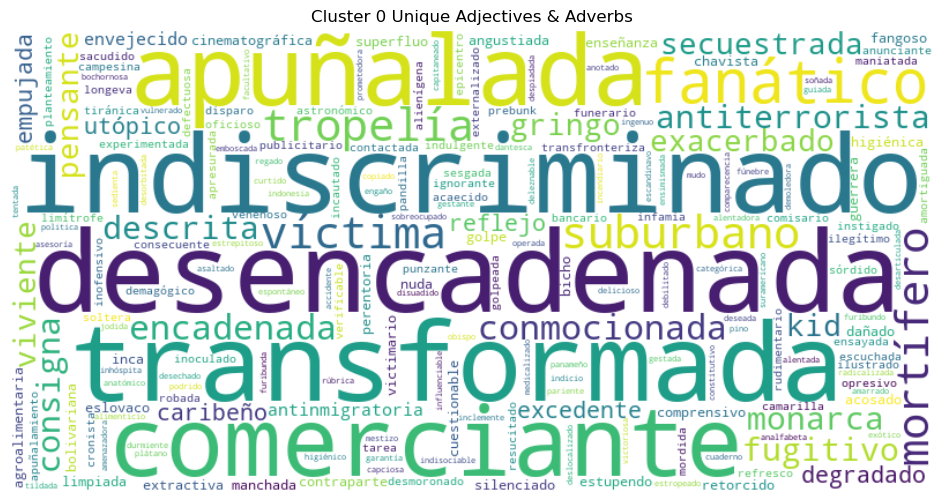

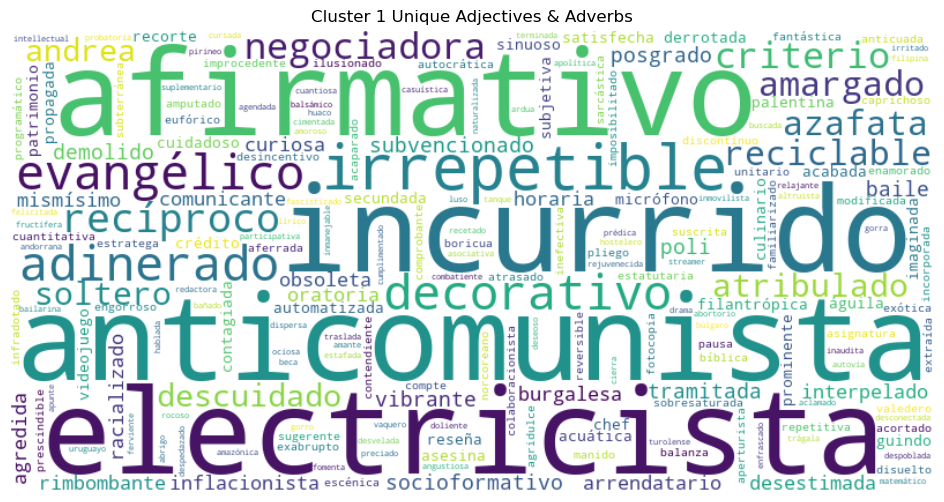

In [242]:
#Wordcloud of the adjective and adverbs
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Function to plot word cloud
def plot_wordcloud(text, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white', collocations=False).generate(text)
    
    plt.figure(figsize=(12, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title)
    plt.show()

# Plot word clouds for unique adjectives and adverbs in each cluster
plot_wordcloud(' '.join(unique_filtered_words_0), "Cluster 0 Unique Adjectives & Adverbs")
plot_wordcloud(' '.join(unique_filtered_words_1), "Cluster 1 Unique Adjectives & Adverbs")


In [247]:
# Identify the most common newspaper per cluster and total number of newspapers
newspaper_summary = []

# Get the total number of news articles per newspaper
total_newspaper_counts = df['newspaper'].value_counts().to_dict()

for label in df['bias'].unique():
    cluster_data = df[df['bias'] == label]
    
    # Count total number of newspapers in the cluster
    total_newspapers = cluster_data['newspaper'].nunique()
    
    # Count news articles per newspaper within this cluster
    newspaper_counts = cluster_data['newspaper'].value_counts().to_dict()
    
    # Calculate percentage of each newspaper's articles within this cluster
    newspaper_bias_summary = {}
    for newspaper, count in newspaper_counts.items():
        total_count = total_newspaper_counts[newspaper]
        bias_percentage = (count / total_count) * 100  # Percentage of articles in this cluster
        newspaper_bias_summary[newspaper] = bias_percentage
    
    # Append results to the summary list
    newspaper_summary.append({
        "Cluster": label,
        "Total Newspapers": total_newspapers,
        "Newspaper Bias Summary": newspaper_bias_summary
    })

# Display results
for result in newspaper_summary:
    print(f"\nCluster {result['Cluster']} - Total Newspapers: {result['Total Newspapers']}")
    for newspaper, bias_percentage in result['Newspaper Bias Summary'].items():
        print(f"{newspaper}: {bias_percentage:.2f}% of its articles are in this cluster")



Cluster 0 - Total Newspapers: 5
el_mundo: 51.08% of its articles are in this cluster
el_pais: 44.12% of its articles are in this cluster
la_vanguardia: 42.42% of its articles are in this cluster
ABC: 37.63% of its articles are in this cluster
20_minutos: 50.52% of its articles are in this cluster

Cluster 1 - Total Newspapers: 5
el_mundo: 48.92% of its articles are in this cluster
el_pais: 55.88% of its articles are in this cluster
la_vanguardia: 57.58% of its articles are in this cluster
ABC: 62.37% of its articles are in this cluster
20_minutos: 49.48% of its articles are in this cluster


C:\Users\jaysh\AppData\Local\Temp\ipykernel_13664\813282392.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  newspaper_bias_df = pd.concat([newspaper_bias_df, pd.DataFrame({


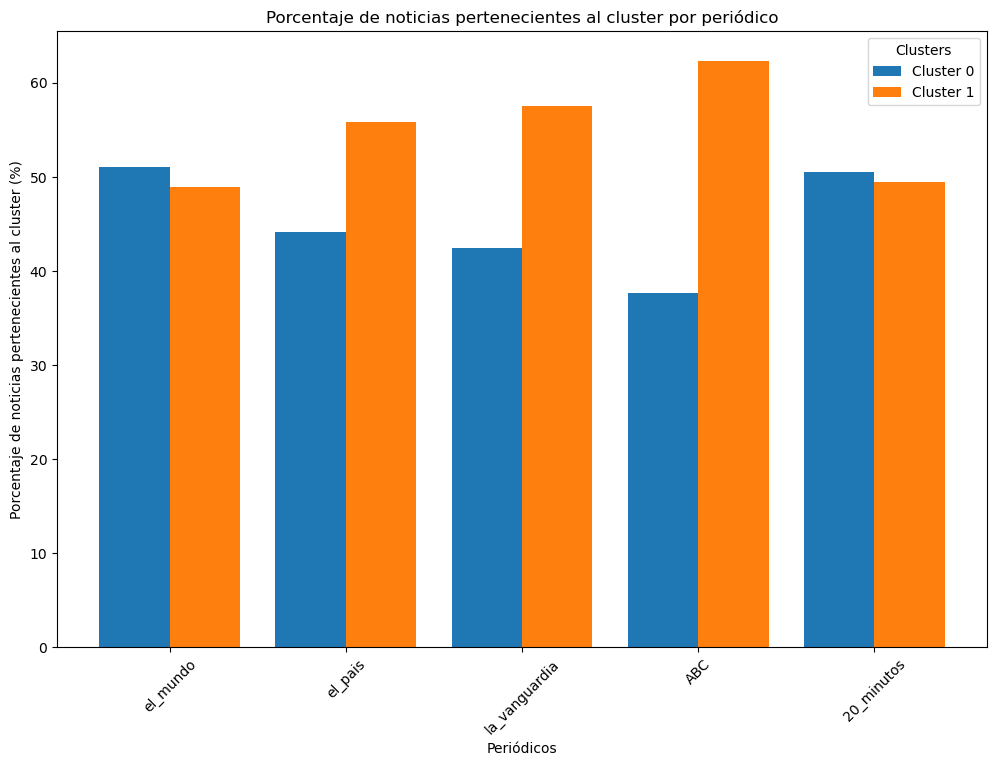

In [250]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Calculate total number of articles per newspaper
total_newspaper_counts = df['newspaper'].value_counts().to_dict()

# Prepare a DataFrame to store the results
newspaper_bias_df = pd.DataFrame(columns=["Newspaper", "Cluster", "Bias_Percentage"])

# Loop through each cluster and calculate bias percentage for each newspaper
for label in df['bias'].unique():
    cluster_data = df[df['bias'] == label]
    
    # Count news articles per newspaper within this cluster
    newspaper_counts = cluster_data['newspaper'].value_counts().to_dict()
    
    # Calculate percentage of each newspaper's articles within this cluster
    for newspaper, count in newspaper_counts.items():
        total_count = total_newspaper_counts[newspaper]
        bias_percentage = (count / total_count) * 100
        newspaper_bias_df = pd.concat([newspaper_bias_df, pd.DataFrame({
            "Newspaper": [newspaper],
            "Cluster": [label],
            "Bias_Percentage": [bias_percentage]
        })], ignore_index=True)

# Prepare data for plotting
newspapers = newspaper_bias_df['Newspaper'].unique()
bar_width = 0.4  # Width of each bar
x_indexes = np.arange(len(newspapers))

# Plotting the results
plt.figure(figsize=(12, 8))

for i, cluster_label in enumerate(sorted(df['bias'].unique())):
    cluster_data = newspaper_bias_df[newspaper_bias_df['Cluster'] == cluster_label]
    bias_percentages = cluster_data.set_index('Newspaper').reindex(newspapers)['Bias_Percentage'].fillna(0)
    
    plt.bar(x_indexes + i * bar_width, bias_percentages, width=bar_width, label=f'Cluster {cluster_label}')

plt.title('Porcentaje de noticias pertenecientes al cluster por periódico')
plt.xlabel('Periódicos')
plt.ylabel('Porcentaje de noticias pertenecientes al cluster (%)')
plt.xticks(ticks=x_indexes + bar_width / 2, labels=newspapers, rotation=45)
plt.legend(title="Clusters")
plt.show()


# Neural Network attempt to use all labels

In [177]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Convert 'text_vectors' column to numpy array
text_vectors = np.array([vec.toarray().flatten() if hasattr(vec, 'toarray') else np.array(vec).flatten() for vec in df['text_vector'].tolist()])

# Combine text vectors with sentiment and stance scores
X = np.hstack([text_vectors, df[['sentiment_score_vader', 'stance_score']].values])
y = df['bias'].values  # This is the label generated from your clustering

# Scale the features for better training performance
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Build the Neural Network
model = tf.keras.models.Sequential([
    tf.keras.layers.InputLayer(input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # Output layer for binary classification
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=20, batch_size=32)

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f"\nTest Accuracy: {accuracy:.4f}")


AttributeError: module 'tensorflow' has no attribute 'keras'